# Descriptive and Sentiment Analysis by TextBlob on Sahel Area Tweets
##### Importing libraries and modules

In [1]:
#analisi di base sentiment twitter giugno-agosto 2020 3 citta con textblob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.offline as py
import plotly.express as px
import re
import nltk

###### importing dataset

In [2]:
df = pd.read_csv('../Dataset/Liptako_bamako_ouadoug.csv')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34868 entries, 0 to 34867
Data columns (total 38 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       34868 non-null  int64  
 1   id               34868 non-null  float64
 2   conversation_id  34868 non-null  float64
 3   created_at       34868 non-null  object 
 4   date             34868 non-null  object 
 5   time             34868 non-null  object 
 6   timezone         34868 non-null  float64
 7   user_id          34868 non-null  float64
 8   username         34868 non-null  object 
 9   name             34868 non-null  object 
 10  place            2276 non-null   object 
 11  tweet            34868 non-null  object 
 12  language         34868 non-null  object 
 13  mentions         34868 non-null  object 
 14  urls             34868 non-null  object 
 15  photos           34868 non-null  object 
 16  replies_count    34868 non-null  float64
 17  retweets_cou

In [3]:
df

,Unnamed: 0,id,conversation_id,created_at,date,time,timezone,user_id,username,name,...,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest,city
0,0,1.300222e+18,1.299832e+18,2020-08-31 01:59:10 CEST,2020-08-31,01:59:10,200.0,1.138782e+18,deejerh_n,Mai Kayan kwalama,...,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN,Liptako
1,1,1.300221e+18,1.300214e+18,2020-08-31 01:58:48 CEST,2020-08-31,01:58:48,200.0,1.138782e+18,deejerh_n,Mai Kayan kwalama,...,NaN,NaN,NaN,NaN,"[{'screen_name': 'jishaq1', 'name': 'Jabir Ish...",NaN,NaN,NaN,NaN,Liptako
2,2,1.300221e+18,1.300214e+18,2020-08-31 01:57:49 CEST,2020-08-31,01:57:49,200.0,1.138782e+18,deejerh_n,Mai Kayan kwalama,...,NaN,NaN,NaN,NaN,"[{'screen_name': 'jishaq1', 'name': 'Jabir Ish...",NaN,NaN,NaN,NaN,Liptako
3,3,1.300219e+18,1.300203e+18,2020-08-31 01:50:46 CEST,2020-08-31,01:50:46,200.0,8.619250e+17,ah_sifawa,born in d 90's,...,NaN,NaN,NaN,NaN,"[{'screen_name': 'Al_ameen_Yabo', 'name': ""Al'...",NaN,NaN,NaN,NaN,Liptako
4,4,1.300217e+18,1.300161e+18,2020-08-31 01:42:53 CEST,2020-08-31,01:42:53,200.0,8.619250e+17,ah_sifawa,born in d 90's,...,NaN,NaN,NaN,NaN,"[{'screen_name': 'galow_rex', 'name': '𝕄𝕌𝕊𝕋𝕆𝕌𝔾...",NaN,NaN,NaN,NaN,Liptako
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34863,34863,1.267269e+18,1.267098e+18,2020-06-01 03:39:08 CEST,2020-06-01,03:39:08,200.0,5.220593e+08,drsegunadeoye,Dr Olusegun Adeoye,...,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN,Ouagadougou
34864,34864,1.267267e+18,1.267103e+18,2020-06-01 03:29:14 CEST,2020-06-01,03:29:14,200.0,5.220593e+08,drsegunadeoye,Dr Olusegun Adeoye,...,NaN,NaN,NaN,NaN,"[{'screen_name': 'scad_official', 'name': 'Sam...",NaN,NaN,NaN,NaN,Ouagadougou
34865,34865,1.267266e+18,1.267103e+18,2020-06-01 03:27:08 CEST,2020-06-01,03:27:08,200.0,5.220593e+08,drsegunadeoye,Dr Olusegun Adeoye,...,NaN,NaN,NaN,NaN,"[{'screen_name': 'scad_official', 'name': 'Sam...",NaN,NaN,NaN,NaN,Ouagadougou
34866,34866,1.267265e+18,1.267104e+18,2020-06-01 03:22:43 CEST,2020-06-01,03:22:43,200.0,5.220593e+08,drsegunadeoye,Dr Olusegun Adeoye,...,NaN,NaN,NaN,NaN,"[{'screen_name': 'Ms_Haesha', 'name': 'Aisha Y...",NaN,NaN,NaN,NaN,Ouagadougou


In [4]:
# Drop first column
#df = df.iloc[: , 1:]

In [ ]:
#df=df.dropna(how='all')

<AxesSubplot:>

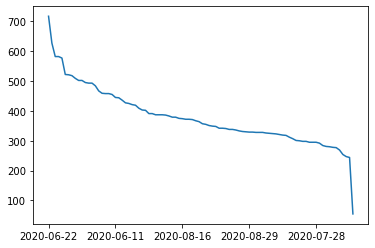

In [5]:
df['date'].value_counts().plot()

###### Removing the unnecessary columns

In [6]:
df = df[['created_at','date','time','tweet','retweets_count','username','city']]

In [7]:
df

,created_at,date,time,tweet,retweets_count,username,city
0,2020-08-31 01:59:10 CEST,2020-08-31,01:59:10,@Sakiniah_bawa Wlhy or 🤣 🤣 🤣,0.0,deejerh_n,Liptako
1,2020-08-31 01:58:48 CEST,2020-08-31,01:58:48,@ Jishaq1 @SKawaah_Bawa Haba Bross don't fall ...,0.0,deejerh_n,Liptako
2,2020-08-31 01:57:49 CEST,2020-08-31,01:57:49,@Sakinah_bawa @ stresses ne 2k,0.0,deejerh_n,Liptako
3,2020-08-31 01:50:46 CEST,2020-08-31,01:50:46,@Al_ameen_yabo 😞😞😞idk,0.0,ah_sifawa,Liptako
4,2020-08-31 01:42:53 CEST,2020-08-31,01:42:53,@galow_rex @__usyy 🚶‍♂️🚶‍♂️🚶‍♂️😩 no story to t...,0.0,ah_sifawa,Liptako
...,...,...,...,...,...,...,...
34863,2020-06-01 03:39:08 CEST,2020-06-01,03:39:08,"@ifeafolayann I agree with this, because it ta...",0.0,drsegunadeoye,Ouagadougou
34864,2020-06-01 03:29:14 CEST,2020-06-01,03:29:14,@scad_official @aproko_doctor Advice***,0.0,drsegunadeoye,Ouagadougou
34865,2020-06-01 03:27:08 CEST,2020-06-01,03:27:08,@scad_official @aproko_doctor If this advise c...,0.0,drsegunadeoye,Ouagadougou
34866,2020-06-01 03:22:43 CEST,2020-06-01,03:22:43,@Ms_Haesha @OoasWaho @DrTedros @MoetiTshidi @J...,0.0,drsegunadeoye,Ouagadougou


###### Plot by tweets count (retweets included) - All cities and by city

<AxesSubplot:xlabel='date', ylabel='tweets+retweets count per day'>

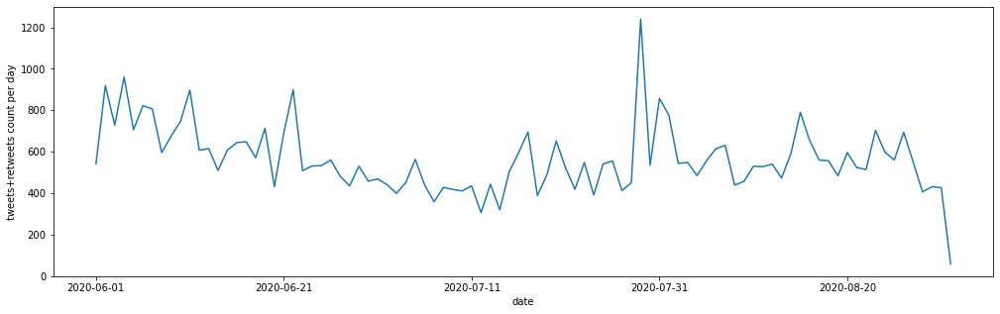

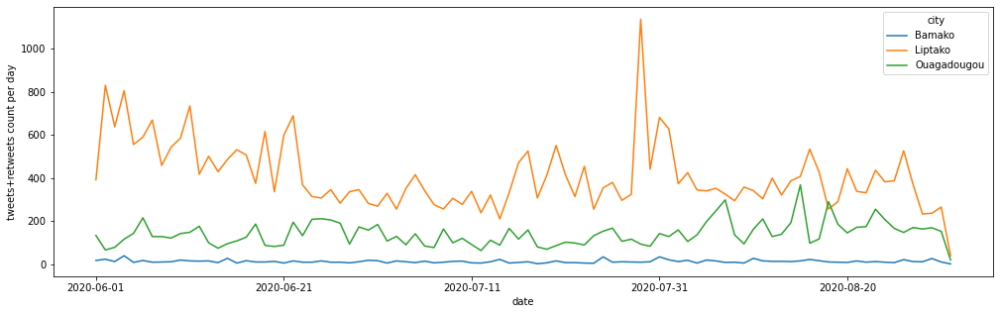

In [8]:
df['tweet_counts'] = df['retweets_count'] + 1

plt.figure(figsize=(17, 5))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
#plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=7))
plt.xlabel('date')
plt.ylabel('tweets+retweets count per day')
plt.xticks(rotation = 'vertical')
df.groupby(df["date"]).sum()["tweet_counts"].plot()
fig, ax = plt.subplots(figsize=(17,5))
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
#plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=9))
plt.xticks(rotation=45)
plt.xlabel('date')
plt.ylabel('tweets+retweets count per day')
#plt.xticks(rotation='vertical')
df.groupby(['date','city']).sum()['tweet_counts'].unstack().plot(ax=ax)

#df.groupby(['date','city']).count()['tweet_counts'].unstack().plot(ax=ax) #senza retweets

###### Plot by tweets count (without retweets) - All cities and by city

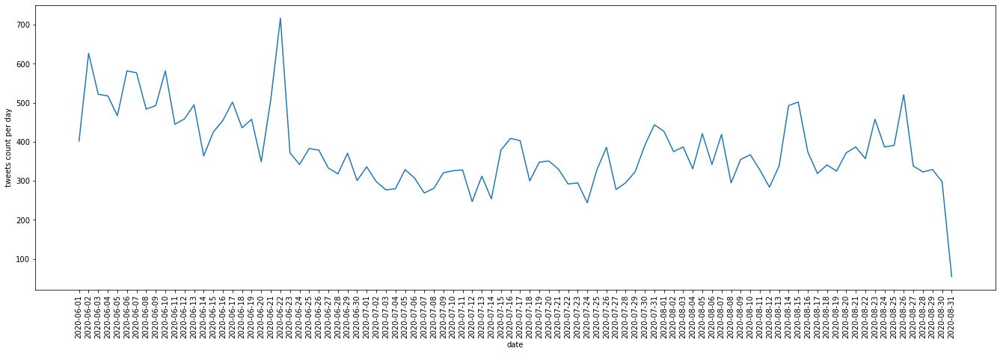

In [14]:
f = plt.figure()
f.set_figwidth(23)
f.set_figheight(7)
plt.xticks(rotation = 'vertical')
plt.xlabel('date')
plt.ylabel('tweets count per day')
plt.plot(df.groupby(df["date"]).count()["tweet_counts"])

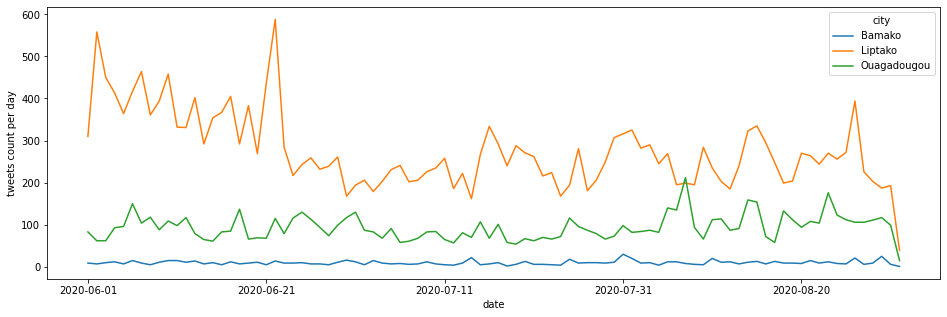

In [15]:

fig, ax = plt.subplots(figsize=(16,5))
plt.xlabel('date')
plt.ylabel('tweets count per day')
df.groupby(['date','city']).count()['tweet_counts'].unstack().plot(ax=ax) #senza retweets
plt.show()

### Descriptive Analysis

In [17]:
y= df.groupby(df["date"]).sum()["tweet_counts"]

In [18]:
#descrittiva per giorno sul numero di tweet
y.describe().transpose()

count      92.000000
mean      563.771739
std       162.639972
min        59.000000
25%       451.500000
50%       541.500000
75%       634.250000
max      1239.000000
Name: tweet_counts, dtype: float64

In [19]:
def get_hashtags(text):
    hashtags = re.findall(r'\#\w+',text.lower())
    return hashtags
def get_mentions(text):
    mentions = re.findall(r'\@\w+',text.lower())
    return mentions

In [20]:
df["date"] = pd.to_datetime(df["date"])
df['time']=pd.to_datetime(df["time"])

In [ ]:
#df.sort_values(by=['created_at'])

In [21]:
df['day']=df['date'].dt.day
df['month']=df['date'].dt.month
df['year']=df['date'].dt.year
df['length']=df['tweet'].apply(lambda x: len(x.split()))
df['hashtags']=df['tweet'].apply(lambda x: get_hashtags(x))
df['mentions']=df['tweet'].apply(lambda x: get_mentions(x))
df['num_hashtags']=df['tweet'].apply(lambda x: len(get_hashtags(x)))
df['num_mentions']=df['tweet'].apply(lambda x: len(get_mentions(x)))
df['hour']=df['time'].apply(lambda x: x.hour)

###### Plot summerizing by hour

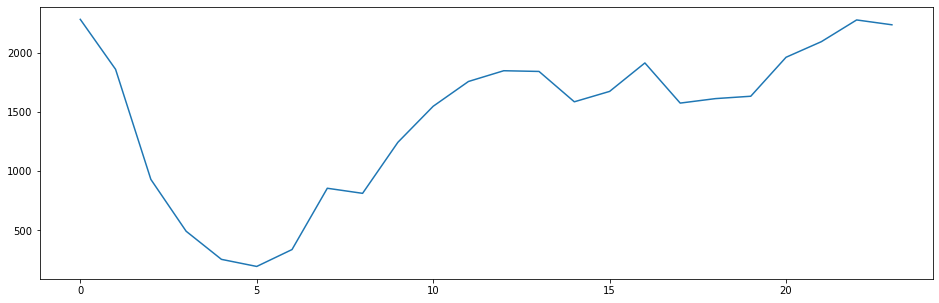

In [22]:
f = plt.figure()
f.set_figwidth(16)
f.set_figheight(5)
#plt.xticks(rotation = 'vertical')
plt.plot(df.groupby(df["hour"]).count()["tweet_counts"])

### TEXT ANALYSIS

In [24]:
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize
stop_words = set(stopwords.words('english')) 
def remove_content(text):
    text = re.sub(r"http\S+", "", text) #remove urls
    text=re.sub(r'\S+\.com\S+','',text) #remove urls
    text=re.sub(r'\@\w+','',text) #remove mentions
    text =re.sub(r'\#\w+','',text) #remove hashtags
    return text
def process_text(text, stem=False): #clean text
    text=remove_content(text)
    text = re.sub('[^A-Za-z]', ' ', text.lower()) #remove non-alphabets
    tokenized_text = word_tokenize(text) #tokenize
    clean_text = [
         word for word in tokenized_text
         if word not in stop_words
    ]
    if stem:
        clean_text=[stemmer.stem(word) for word in clean_text]
    return ' '.join(clean_text)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/robertamaisano/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [25]:
import warnings
warnings.simplefilter('ignore')

In [26]:
df['cleaned_tweets']=df['tweet'].apply(lambda x: process_text(x))#remove non-alphabets and tokenize non stopwords

In [27]:
df['tweet_remove_url_men_hash']=df['tweet'].apply(lambda x: remove_content(x))#remove url mentions hashtag

In [28]:
df

,created_at,date,time,tweet,retweets_count,username,city,tweet_counts,day,month,year,length,hashtags,mentions,num_hashtags,num_mentions,hour,cleaned_tweets,tweet_remove_url_men_hash
0,2020-08-31 01:59:10 CEST,2020-08-31,2021-11-14 01:59:10,@Sakiniah_bawa Wlhy or 🤣 🤣 🤣,0.0,deejerh_n,Liptako,1.0,31,8,2020,6,[],[@sakiniah_bawa],0,1,1,wlhy,Wlhy or 🤣 🤣 🤣
1,2020-08-31 01:58:48 CEST,2020-08-31,2021-11-14 01:58:48,@ Jishaq1 @SKawaah_Bawa Haba Bross don't fall ...,0.0,deejerh_n,Liptako,1.0,31,8,2020,10,[],[@skawaah_bawa],0,1,1,jishaq haba bross fall hands,@ Jishaq1 Haba Bross don't fall for our hands
2,2020-08-31 01:57:49 CEST,2020-08-31,2021-11-14 01:57:49,@Sakinah_bawa @ stresses ne 2k,0.0,deejerh_n,Liptako,1.0,31,8,2020,5,[],[@sakinah_bawa],0,1,1,stresses ne k,@ stresses ne 2k
3,2020-08-31 01:50:46 CEST,2020-08-31,2021-11-14 01:50:46,@Al_ameen_yabo 😞😞😞idk,0.0,ah_sifawa,Liptako,1.0,31,8,2020,2,[],[@al_ameen_yabo],0,1,1,idk,😞😞😞idk
4,2020-08-31 01:42:53 CEST,2020-08-31,2021-11-14 01:42:53,@galow_rex @__usyy 🚶‍♂️🚶‍♂️🚶‍♂️😩 no story to t...,0.0,ah_sifawa,Liptako,1.0,31,8,2020,10,[],"[@galow_rex, @__usyy]",0,2,1,story tell heart breaks everywhere,🚶‍♂️🚶‍♂️🚶‍♂️😩 no story to tell!!! Heart brea...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34863,2020-06-01 03:39:08 CEST,2020-06-01,2021-11-14 03:39:08,"@ifeafolayann I agree with this, because it ta...",0.0,drsegunadeoye,Ouagadougou,1.0,1,6,2020,38,[],[@ifeafolayann],0,1,3,agree take male naturally rape female naturall...,"I agree with this, because it take a male to ..."
34864,2020-06-01 03:29:14 CEST,2020-06-01,2021-11-14 03:29:14,@scad_official @aproko_doctor Advice***,0.0,drsegunadeoye,Ouagadougou,1.0,1,6,2020,3,[],"[@scad_official, @aproko_doctor]",0,2,3,advice,Advice***
34865,2020-06-01 03:27:08 CEST,2020-06-01,2021-11-14 03:27:08,@scad_official @aproko_doctor If this advise c...,0.0,drsegunadeoye,Ouagadougou,1.0,1,6,2020,43,[],"[@scad_official, @aproko_doctor]",0,2,3,advise prevent future occurrence think victim ...,If this advise can prevent future occurrence...
34866,2020-06-01 03:22:43 CEST,2020-06-01,2021-11-14 03:22:43,@Ms_Haesha @OoasWaho @DrTedros @MoetiTshidi @J...,0.0,drsegunadeoye,Ouagadougou,1.0,1,6,2020,13,[],"[@ms_haesha, @ooaswaho, @drtedros, @moetitshid...",0,10,3,absolutely,It absolutely does!!!


##### Top hashtag for specific date

In [29]:
#TOP HASHTAG PER UNA DATA
df1 = df[['hashtags','date']]


In [85]:
from sklearn.feature_extraction.text import CountVectorizer
def plot_topn(sentences, ngram_range=(1,3), top=20,firstword=''):
    c=CountVectorizer(ngram_range=ngram_range)
    X=c.fit_transform(sentences)
    words=pd.DataFrame(X.sum(axis=0),columns=c.get_feature_names()).T.sort_values(0,ascending=False).reset_index()
    res=words[words['index'].apply(lambda x: firstword in x)].head(top)
    pl=px.bar(res, x='index',y=0)
    pl.update_layout(yaxis_title='count',xaxis_title='Phrases')
    pl.show()
    #pl.show('png')

In [31]:
hash_jul= df1[df1['date']== '2020-07-29']
hash_jul

,hashtags,date
8192,[],2020-07-29
8193,[],2020-07-29
8194,[],2020-07-29
8195,[],2020-07-29
8196,[],2020-07-29
...,...,...
29844,[],2020-07-29
29845,[],2020-07-29
29846,"[#dialoguity, #presimetrebf]",2020-07-29
29847,"[#leterturedelaseman, #holland]",2020-07-29


In [32]:
hashes_29jul=hash_jul['hashtags'].tolist()
tags_29jul=[]
for x in hashes_29jul:
    if x:
        tags_29jul.extend(x)

In [33]:
plot_topn(tags_29jul)

In [34]:
hash_16aug= df1[df1['date']== '2020-08-16']
hash_16aug

,hashtags,date
3469,[],2020-08-16
3470,[],2020-08-16
3471,[],2020-08-16
3472,[],2020-08-16
3473,[],2020-08-16
...,...,...
27908,[],2020-08-16
27909,[#burkina],2020-08-16
27910,[],2020-08-16
27911,[],2020-08-16


In [35]:
hashes_16aug=hash_16aug['hashtags'].tolist()
tags_16aug=[]
for x in hashes_16aug:
    if x:
        tags_16aug.extend(x)

In [36]:
plot_topn(tags_16aug)

#### Top Hashtags and Mentions Analysis

In [37]:
#TOP HASHTAG
hashes=df['hashtags'].tolist()
tags=[]
for x in hashes:
    if x:
        tags.extend(x)

In [38]:
plot_topn(tags)

In [39]:
#TOP MENTIONS

mentions=df['mentions'].tolist()
men=[]
for x in mentions:
    if x:
        men.extend(x)
len(men)


32449

In [42]:
plot_topn(men)

# Sentiment Analysis by TextBlob

In [43]:
#SENTIMENT CON TEXTBLOB
from textblob import TextBlob
df['sentiment']=df['tweet_remove_url_men_hash'].apply(lambda x:TextBlob(x).sentiment[0])
df['subject']=df['tweet_remove_url_men_hash'].apply(lambda x: TextBlob(x).sentiment[1])
df['polarity']=df['sentiment'].apply(lambda x: 'pos' if x>=0 else 'neg')
df.to_csv('CITIES_SENTIMENT_TEXTBLOB.csv',index=False)

In [67]:
fig=px.histogram(df[df['subject']>=0], x='polarity', color='polarity')
fig.show()

In [60]:
fig=px.histogram(df[df['subject']>0.5], x='polarity', color='polarity')
fig.show()

#### Hourly SENTIMENT (COUNT ALL TWEETS)

In [44]:
#SENTIMENT PER ORA (COUNT ALL TWEETS)

import plotly.express as px
fig=px.histogram(df, x='hour', y='tweet_counts',color='polarity')
fig.update_layout(
    barmode="group",
    bargap=0.4,
yaxis_title='Tweet Counts')
fig.show()

In [51]:
df

,created_at,date,time,tweet,retweets_count,username,city,tweet_counts,day,month,...,mentions,num_hashtags,num_mentions,hour,cleaned_tweets,tweet_remove_url_men_hash,sentiment,subject,polarity,num_tweets
0,2020-08-31 01:59:10 CEST,2020-08-31,2021-11-14 01:59:10,@Sakiniah_bawa Wlhy or 🤣 🤣 🤣,0.0,deejerh_n,Liptako,1.0,31,8,...,[@sakiniah_bawa],0,1,1,wlhy,Wlhy or 🤣 🤣 🤣,0.000000,0.000000,pos,34868
1,2020-08-31 01:58:48 CEST,2020-08-31,2021-11-14 01:58:48,@ Jishaq1 @SKawaah_Bawa Haba Bross don't fall ...,0.0,deejerh_n,Liptako,1.0,31,8,...,[@skawaah_bawa],0,1,1,jishaq haba bross fall hands,@ Jishaq1 Haba Bross don't fall for our hands,0.000000,0.000000,pos,34868
2,2020-08-31 01:57:49 CEST,2020-08-31,2021-11-14 01:57:49,@Sakinah_bawa @ stresses ne 2k,0.0,deejerh_n,Liptako,1.0,31,8,...,[@sakinah_bawa],0,1,1,stresses ne k,@ stresses ne 2k,0.000000,0.000000,pos,34868
3,2020-08-31 01:50:46 CEST,2020-08-31,2021-11-14 01:50:46,@Al_ameen_yabo 😞😞😞idk,0.0,ah_sifawa,Liptako,1.0,31,8,...,[@al_ameen_yabo],0,1,1,idk,😞😞😞idk,0.000000,0.000000,pos,34868
4,2020-08-31 01:42:53 CEST,2020-08-31,2021-11-14 01:42:53,@galow_rex @__usyy 🚶‍♂️🚶‍♂️🚶‍♂️😩 no story to t...,0.0,ah_sifawa,Liptako,1.0,31,8,...,"[@galow_rex, @__usyy]",0,2,1,story tell heart breaks everywhere,🚶‍♂️🚶‍♂️🚶‍♂️😩 no story to tell!!! Heart brea...,0.000000,0.000000,pos,34868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34863,2020-06-01 03:39:08 CEST,2020-06-01,2021-11-14 03:39:08,"@ifeafolayann I agree with this, because it ta...",0.0,drsegunadeoye,Ouagadougou,1.0,1,6,...,[@ifeafolayann],0,1,3,agree take male naturally rape female naturall...,"I agree with this, because it take a male to ...",0.040000,0.246667,pos,34868
34864,2020-06-01 03:29:14 CEST,2020-06-01,2021-11-14 03:29:14,@scad_official @aproko_doctor Advice***,0.0,drsegunadeoye,Ouagadougou,1.0,1,6,...,"[@scad_official, @aproko_doctor]",0,2,3,advice,Advice***,0.000000,0.000000,pos,34868
34865,2020-06-01 03:27:08 CEST,2020-06-01,2021-11-14 03:27:08,@scad_official @aproko_doctor If this advise c...,0.0,drsegunadeoye,Ouagadougou,1.0,1,6,...,"[@scad_official, @aproko_doctor]",0,2,3,advise prevent future occurrence think victim ...,If this advise can prevent future occurrence...,0.026786,0.201786,pos,34868
34866,2020-06-01 03:22:43 CEST,2020-06-01,2021-11-14 03:22:43,@Ms_Haesha @OoasWaho @DrTedros @MoetiTshidi @J...,0.0,drsegunadeoye,Ouagadougou,1.0,1,6,...,"[@ms_haesha, @ooaswaho, @drtedros, @moetitshid...",0,10,3,absolutely,It absolutely does!!!,0.390625,0.900000,pos,34868


#### Hourly Sentiment polarity Plot with TextBlob

In [69]:
df['num_tweets']=df['tweet_counts']-df['retweets_count']

In [70]:
#SENTIMENT PER ora (COUNT ALL TWEETS) PIU' UTILE

import plotly.express as px
fig=px.histogram(df, x='hour', y='num_tweets',color='polarity')
fig.update_layout(
    barmode="group",
    bargap=0.4,
yaxis_title='Tweets Count')
fig.show()

### Sentiment polarity by day 

In [71]:
#SENTIMENT PER GIORNO (COUNT ALL TWEETS) 

import plotly.express as px
fig=px.histogram(df, x='day', y='tweet_counts',color='polarity')
fig.update_layout(
    barmode="group",
    bargap=0.4,
yaxis_title='Tweets Count')
fig.show()

### Sentiment polarity by date with and without retweets

In [75]:
#SENTIMENT PER DATA (COUNT ALL TWEETS) 

import plotly.express as px
fig=px.histogram(df, x='date', y='tweet_counts',color='polarity')
fig.update_layout(
    barmode="group",
    bargap=0.4,
yaxis_title='Tweets Count')
fig.show()

In [74]:
#SENTIMENT PER DATA (COUNT ALL TWEETS) 

import plotly.express as px
fig=px.histogram(df, x='date', y='num_tweets',color='polarity')
fig.update_layout(
    barmode="group",
    bargap=0.4,
yaxis_title='Tweets Count')
fig.show()

### Words Analysis

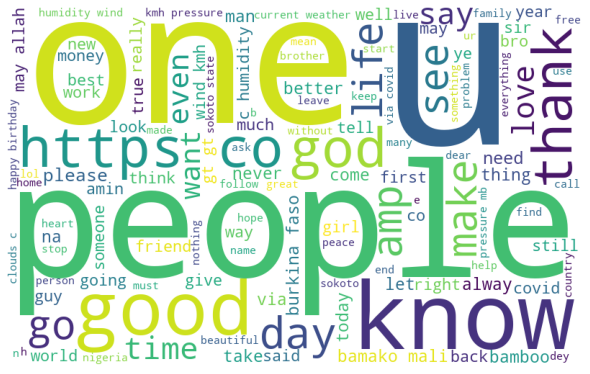

In [84]:
import wordcloud
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
temp=' '.join(df['cleaned_tweets'].tolist())
wordcloud = WordCloud(width = 800, height = 500, 
                background_color ='white', 
                min_font_size = 10).generate(temp)
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0) 
plt.show()

In [86]:
plot_topn(df['cleaned_tweets'].values, ngram_range=(1,1))

In [87]:
plot_topn(df['cleaned_tweets'].values, ngram_range=(2,2))

In [88]:
plot_topn(df['cleaned_tweets'].values, ngram_range=(3,3))

In [89]:
df.to_csv('sahel_jun_aug_2020_en_all_clean_base_sentiment:textblob.csv')